<a href="https://colab.research.google.com/github/thesyzling/first_ai_project/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import tensorflow as tf
import tensorflow_hub as hub
print("Tf version:", tf.__version__ )
print("Hub version:", hub.__version__ )
print("GPU", "Avaliable:" if tf.config.list_physical_devices("GPU") else "No gpu")

Tf version: 2.18.0
Hub version: 0.16.1
GPU Avaliable:


In [2]:
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: xlabel='breed'>

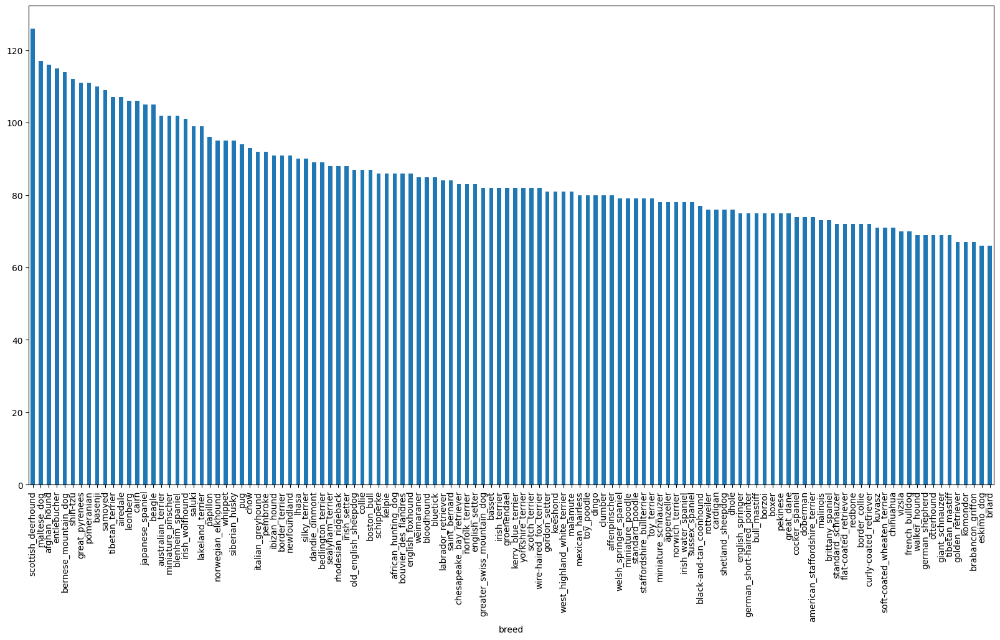

In [3]:
labels_csv["breed"].value_counts().plot.bar(figsize = (20, 10))

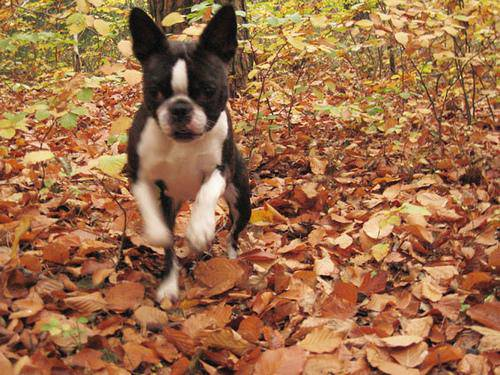

In [4]:
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [5]:
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [6]:
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train")) == len(filenames):
  print("Filenames match actual amount of files!")
else:
  print("Filenames do not match actual amount of files")

Filenames match actual amount of files!


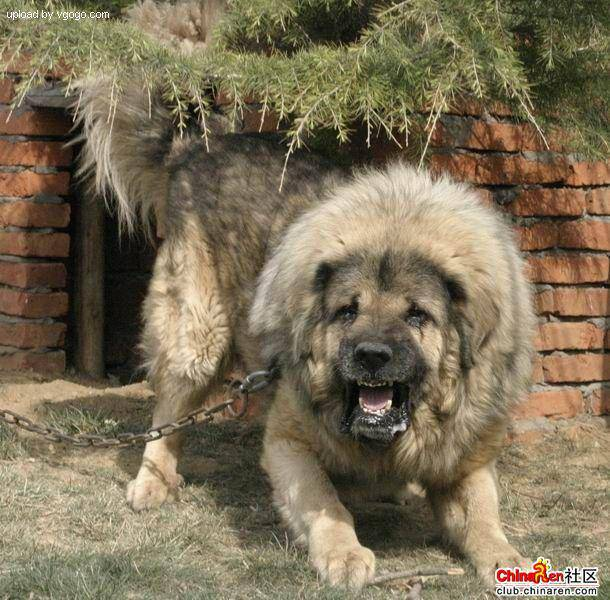

In [7]:
Image(filenames[9000])

In [8]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [9]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [10]:
len(labels)

10222

In [11]:
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames")
else:
  print("Number of files doesn't match numbers")

Number of labels matches number of filenames


In [12]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [13]:
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [14]:
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [15]:
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [16]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [17]:
X = filenames
y = boolean_labels

In [18]:
len(filenames)

10222

In [19]:
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [20]:
from sklearn.model_selection import train_test_split

np.random.seed(42)

X_train , X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state = 42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [21]:
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

In [22]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [23]:
tf.constant(image[:2])

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [24]:
image.max(), image.min()

(np.uint8(255), np.uint8(0))

In [25]:
IMG_SIZE = 224

def process_image(image_path):
  """
  Takes an image file path and turns the image into a Tensor
  """
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

In [26]:
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [27]:
(process_image(X[42]), y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [28]:
BATCH_SIZE = 32

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))

    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data = data.shuffle(buffer_size=len(X))

    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [29]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [30]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [31]:
import matplotlib.pyplot as plt

def show_25_images(images, labels):
  plt.figure(figsize=(10, 10))
  for i in range(25):
    ax = plt.subplot(5, 5, i + 1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [32]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.5172732 , 0.6441289 , 0.48288944],
          [0.49152547, 0.6329471 , 0.46939647],
          [0.3896039 , 0.5500876 , 0.38449797],
          ...,
          [0.19353259, 0.18972787, 0.18171577],
          [0.25622377, 0.2523022 , 0.2440564 ],
          [0.3808576 , 0.37693602, 0.36869022]],
 
         [[0.5079914 , 0.6371228 , 0.47414148],
          [0.40571582, 0.5492203 , 0.3807856 ],
          [0.27094033, 0.4329852 , 0.26175755],
          ...,
          [0.3234815 , 0.32269335, 0.30965003],
          [0.29295626, 0.29024267, 0.27334842],
          [0.32606792, 0.32335433, 0.30646008]],
 
         [[0.48067614, 0.6224246 , 0.44573215],
          [0.36351934, 0.5120046 , 0.33410838],
          [0.24627493, 0.408904  , 0.22925164],
          ...,
          [0.32679695, 0.3323094 , 0.30491522],
          [0.27069768, 0.2756259 , 0.24706323],
          [0.2737152 , 0.27864343, 0.25008073]],
 
         ...,
 
         [[0.72152245, 0.72152245, 0.72152245],
          [0.83871

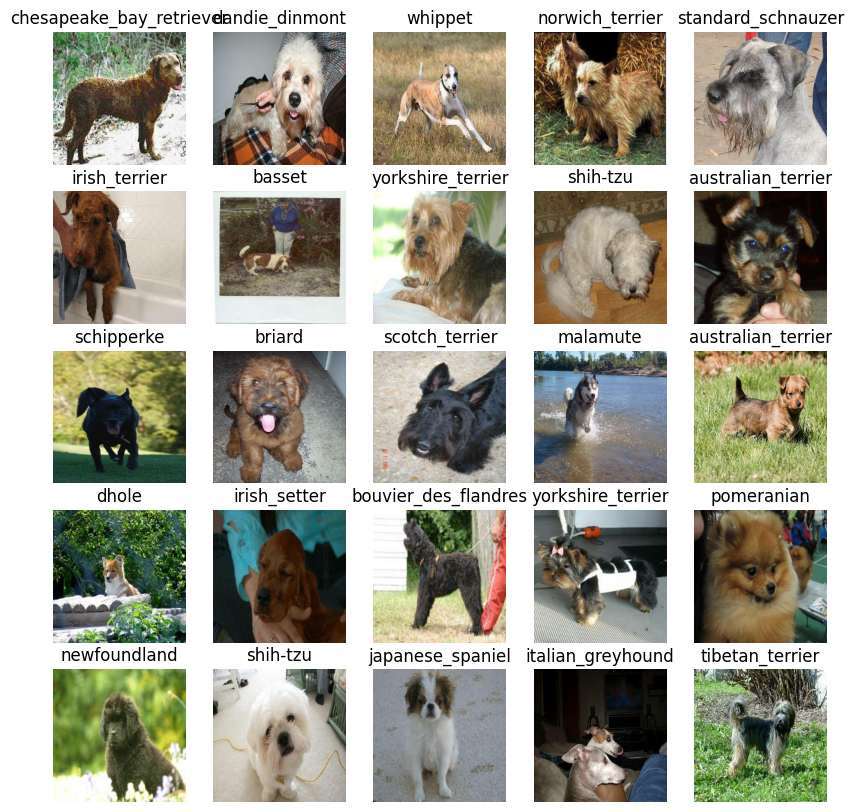

In [33]:
show_25_images(train_images, train_labels)

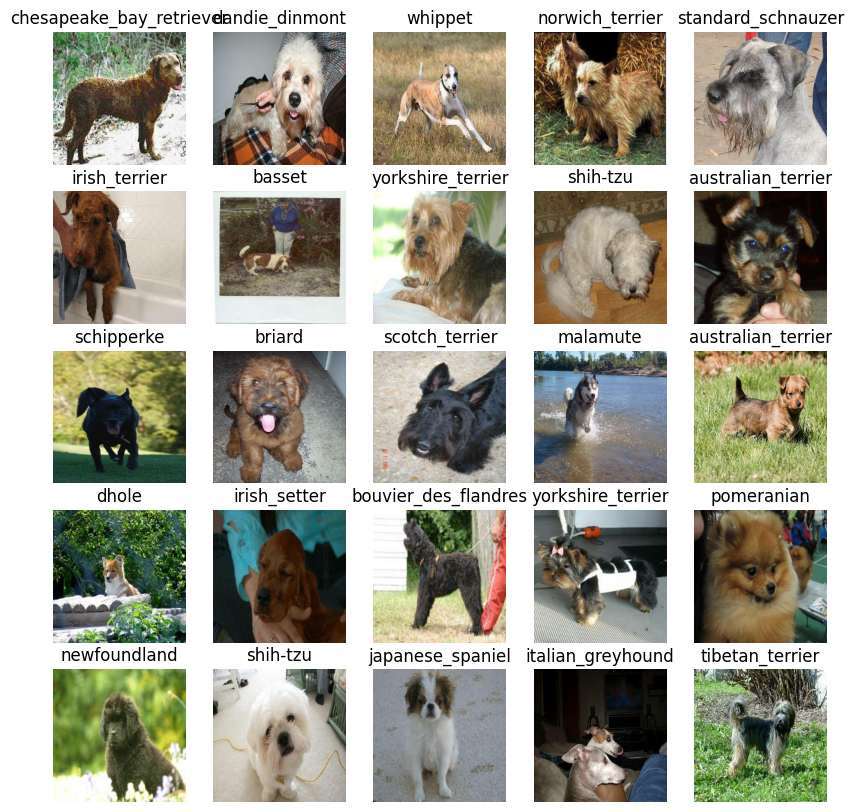

In [34]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

In [35]:
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

OUTPUT_SHAPE = len(unique_breeds)

MODEL_URL = "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"

In [71]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)
  hubs_layer = hub.KerasLayer(MODEL_URL)

  model = tf.keras.Sequential([
    tf.keras.layers.Lambda(lambda x: hubs_layer(x)), # Layer 1 (input layer)

    tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax") # Layer 2 (output layer)

    ])

  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  model.build(INPUT_SHAPE)
  return model

In [72]:
model = create_model()
model.summary()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lambda_3 (Lambda)               │ (None, 1001)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 120)            │       120,240 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 120,240 (469.69 KB)

 Trainable params: 120,240 (469.69 KB)

 Non-trainable params: 0 (0.00 B)

In [38]:
%load_ext tensorboard

In [39]:
import datetime

def create_tensorboard_callback():
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)

In [40]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3 )

In [41]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [42]:
print("GPU","Avaliable (YES)" if tf.config.list_physical_devices("GPU") else "not avaliable" )

GPU Avaliable (YES)


In [43]:
def train_model():
  model = create_model()
  tensorboard = create_tensorboard_callback()
  model.fit(x=train_data, epochs=NUM_EPOCHS, validation_data=val_data, validation_freq =1, callbacks=[tensorboard, early_stopping])

  return model

In [44]:
model = train_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 143s 5s/step - accuracy: 0.0295 - loss: 5.1356 - val_accuracy: 0.2550 - val_loss: 3.4650
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 190ms/step - accuracy: 0.6391 - loss: 1.8963 - val_accuracy: 0.4850 - val_loss: 2.2554
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - accuracy: 0.9110 - loss: 0.6573 - val_accuracy: 0.5750 - val_loss: 1.7843
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - accuracy: 0.9847 - loss: 0.2838 - val_accuracy: 0.6200 - val_loss: 1.5972
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - accuracy: 0.9958 - loss: 0.1524 - val_accuracy: 0.6250 - val_loss: 1.5130
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 191ms/step - accuracy: 0.9993 - loss: 0.1037 - val_accuracy: 0.6400 - val_loss: 1.4741
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - accuracy: 1.0000 - loss: 0.0785 - val_accuracy: 0.6450 - val_loss: 1

In [45]:
%load_ext tensorboard
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [46]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [47]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 604ms/step


array([[3.75190692e-04, 1.01016463e-04, 5.66597504e-04, ...,
        4.72184853e-04, 6.90435809e-06, 9.88598098e-04],
       [2.57987482e-03, 7.91113707e-04, 4.12232149e-03, ...,
        3.29078495e-04, 3.25989304e-03, 6.30729628e-05],
       [9.10984454e-06, 1.36227594e-04, 2.23748193e-05, ...,
        1.19322074e-04, 2.16954995e-05, 1.35639682e-04],
       ...,
       [1.15318483e-06, 1.08010208e-05, 1.59370058e-04, ...,
        7.24658094e-06, 2.09156831e-04, 7.51279003e-05],
       [1.27716246e-03, 1.22126250e-04, 1.09784523e-04, ...,
        7.42727279e-05, 3.93051705e-05, 1.42215835e-02],
       [4.08774271e-04, 1.10372945e-04, 1.89033500e-03, ...,
        1.56539155e-03, 8.15493520e-04, 6.25582034e-05]], dtype=float32)

In [48]:
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Index of max value: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[7.51309708e-05 3.36178637e-05 4.12660993e-05 2.39752717e-05
 4.84415388e-04 4.68707112e-05 1.93023428e-04 4.34490008e-04
 8.56803916e-03 6.17214888e-02 2.79226515e-05 4.80940207e-06
 1.30429259e-03 1.59114471e-03 1.45971135e-03 2.62490334e-03
 2.95898153e-05 5.96403668e-04 2.38951383e-04 1.04602499e-04
 2.52023510e-05 6.79142948e-04 5.08419798e-05 6.94745177e-05
 1.49369352e-02 8.37897969e-05 1.58598396e-05 1.61598742e-04
 1.28736909e-04 3.53934665e-05 5.20803806e-05 9.00491505e-05
 6.61348349e-06 5.34270512e-05 3.19711908e-05 3.77803881e-05
 2.05605291e-04 2.83457251e-04 5.75948070e-05 2.05407932e-01
 4.02933329e-05 3.62102110e-05 2.56399973e-03 2.80929953e-06
 5.37148910e-04 1.81010400e-05 3.45033877e-05 4.88831371e-04
 7.05561324e-05 2.15145395e-04 9.39760794e-05 7.57034068e-05
 5.51762350e-05 2.43413588e-03 3.99665005e-05 4.58171242e-04
 4.72508036e-05 2.79435098e-05 2.45038573e-05 2.36462874e-05
 1.69195737e-05 8.63694004e-04 4.66889787e-06 1.69254799e-05
 6.81765887e-05 2.534499

In [49]:
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label = get_pred_label(predictions[10])
pred_label

'yorkshire_terrier'

In [50]:
def unbatchify(data):
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(label)

  return images, labels

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [51]:
images_ = []
labels_ = []

for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)


In [52]:
def plot_pred(prediction_probabilities, labels, images, n):
    pred_prob = prediction_probabilities[n]
    true_label = labels[n]
    image = images[n]
    pred_label = get_pred_label(pred_prob)

    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    # Handle one-hot or scalar labels
    if isinstance(true_label, (np.ndarray, list)):
        true_label = np.argmax(true_label)

    color = "green" if pred_label == true_label else "red"
    plt.title(
        "{} {:.0f}% ({})".format(
            pred_label, 100 * np.max(pred_prob),
            "Correct" if pred_label == true_label else "Wrong"
        ),
        color=color
    )


In [53]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
    pred_prob = prediction_probabilities[n]
    true_label = labels[n]
    pred_label = get_pred_label(pred_prob)

    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
    top_10_pred_values = pred_prob[top_10_pred_indexes]
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    bars = plt.bar(np.arange(len(top_10_pred_labels)), top_10_pred_values, color="gray")
    plt.xticks(np.arange(len(top_10_pred_labels)), labels=top_10_pred_labels, rotation="vertical")

    # Handle scalar or one-hot encoded true label
    if isinstance(true_label, (np.ndarray, list)):
        true_label = np.argmax(true_label)

    if true_label in top_10_pred_indexes:
        bar_index = np.where(top_10_pred_indexes == true_label)[0][0]
        bars[bar_index].set_color("green")
    else:
        bars[0].set_color("red")  # optional fallback


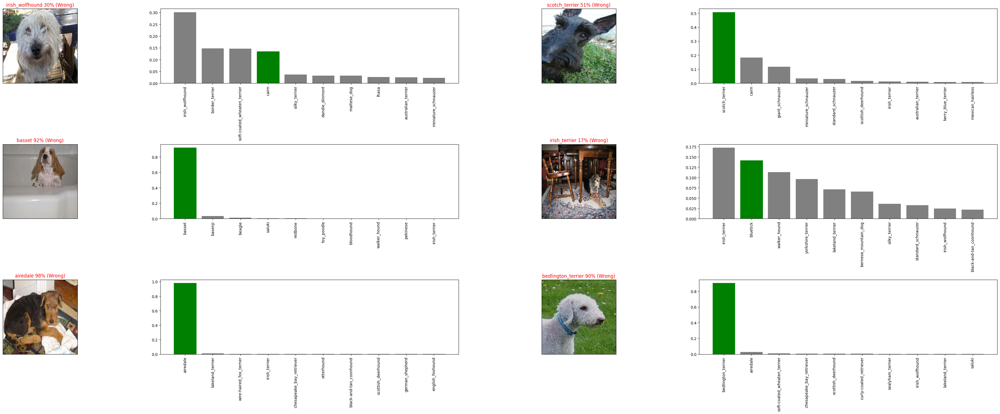

In [54]:
val_images = images_
val_labels = labels_

i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols

plt.figure(figsize=(10*2*num_cols, 5*num_rows))
for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=i_multiplier+i)

    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=i_multiplier+i)

plt.tight_layout(h_pad=1.0)
plt.show()


In [55]:
def save_model(model, suffix=None):
  modeldir = os.path.join("drive/My Drive/Dog Vision/models", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".keras"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [56]:
def load_model(model_path):
  print(f"Loading saved model from:",{model_path})
  # Load the model from the SavedModel format
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [57]:
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20250627-101259-1000-images-mobilenetv2-Adam.keras...


'drive/My Drive/Dog Vision/models/20250627-101259-1000-images-mobilenetv2-Adam.keras'

## Full data

In [58]:
full_data = create_data_batches(X, y)

Creating training data batches...


In [59]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [60]:
full_model = create_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


In [61]:
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

In [62]:
full_model.fit(x=full_data, epochs=NUM_EPOCHS, callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - accuracy: 0.4938 - loss: 2.3856
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 74s 109ms/step - accuracy: 0.8919 - loss: 0.3762
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 110ms/step - accuracy: 0.9394 - loss: 0.2272
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 112ms/step - accuracy: 0.9695 - loss: 0.1375
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - accuracy: 0.9812 - loss: 0.0986
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 39s 122ms/step - accuracy: 0.9882 - loss: 0.0741
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 118ms/step - accuracy: 0.9926 - loss: 0.0538
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 118ms/step - accuracy: 0.9957 - loss: 0.0434
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - accuracy: 0.9966 - loss: 0.0345
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - accuracy: 0.9959 - loss: 0.0319
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - accuracy: 0.9991 - loss: 0.0221
Epoch 12

In [63]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20250627-102713-full-image-set-mobilenetv2-Adam.keras...


'drive/My Drive/Dog Vision/models/20250627-102713-full-image-set-mobilenetv2-Adam.keras'

In [64]:
from keras.models import load_model
import keras
import tensorflow_hub as hub

keras.config.enable_unsafe_deserialization()

custom_objects = {
    'KerasLayer': hub.KerasLayer
}

loaded_full_model = load_model(
    "drive/My Drive/Dog Vision/models/20250524-223841-full-image-set-mobilenetv2-Adam.keras",
    custom_objects=custom_objects,
    safe_mode=False
)


In [65]:
test_path = "drive/My Drive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/Dog Vision/test/e713f150e4f9fc828f8a28705755f199.jpg',
 'drive/My Drive/Dog Vision/test/e265af5e8f446888c6e7ec31f803d63e.jpg',
 'drive/My Drive/Dog Vision/test/e18c30f7ba3680d75ff326ccb71642e0.jpg',
 'drive/My Drive/Dog Vision/test/e2628b6bde028b5eb593616128728907.jpg',
 'drive/My Drive/Dog Vision/test/e2faaf5e760a6189d0980e6355864b4c.jpg',
 'drive/My Drive/Dog Vision/test/e411a1b3681604f6321af7cb8e8f2de7.jpg',
 'drive/My Drive/Dog Vision/test/dfc5d207b533d381045984a0a0adb23c.jpg',
 'drive/My Drive/Dog Vision/test/de2c6675c001726a96ad9d72ab229f3a.jpg',
 'drive/My Drive/Dog Vision/test/e27567e188000db387977cdb9bbdcf82.jpg',
 'drive/My Drive/Dog Vision/test/df99a948e43d3399aff2e8ab2c18e184.jpg']

In [66]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [67]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>